In [1]:
from ridge_map import RidgeMap

Creating C:\Users\Anders\.cache\srtm
4 25934402
4 25934402
4 25934402
4 25934402


<AxesSubplot: >

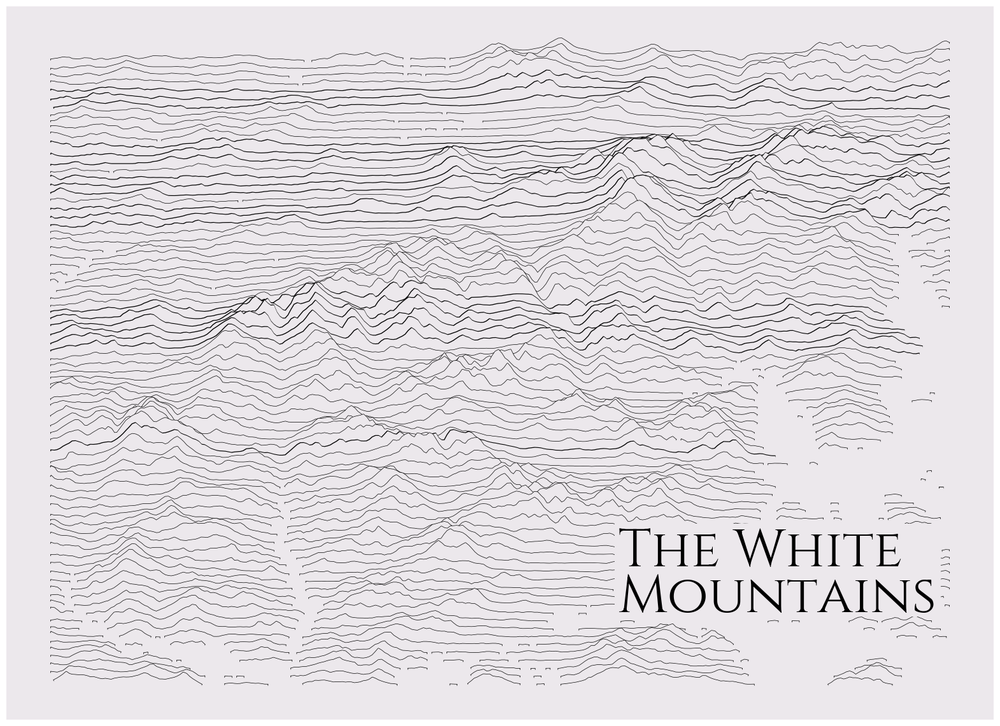

In [2]:
RidgeMap().plot_map()

4 2884802


<AxesSubplot: >

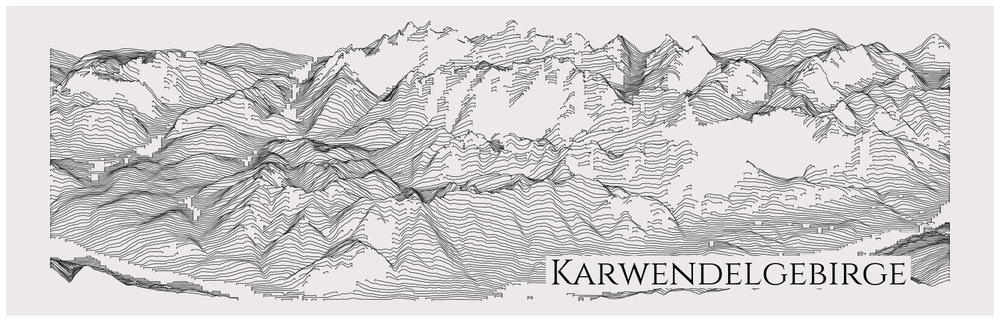

In [3]:
rm = RidgeMap((11.098251,47.264786,11.695633,47.453630))
values = rm.get_elevation_data(num_lines=150)
values=rm.preprocess(
    values=values,
    lake_flatness=2,
    water_ntile=10,
    vertical_ratio=240)
rm.plot_map(values=values,
            label='Karwendelgebirge',
            label_y=0.1,
            label_x=0.55,
            label_size=40,
            linewidth=2)

4 25934402


<AxesSubplot: >

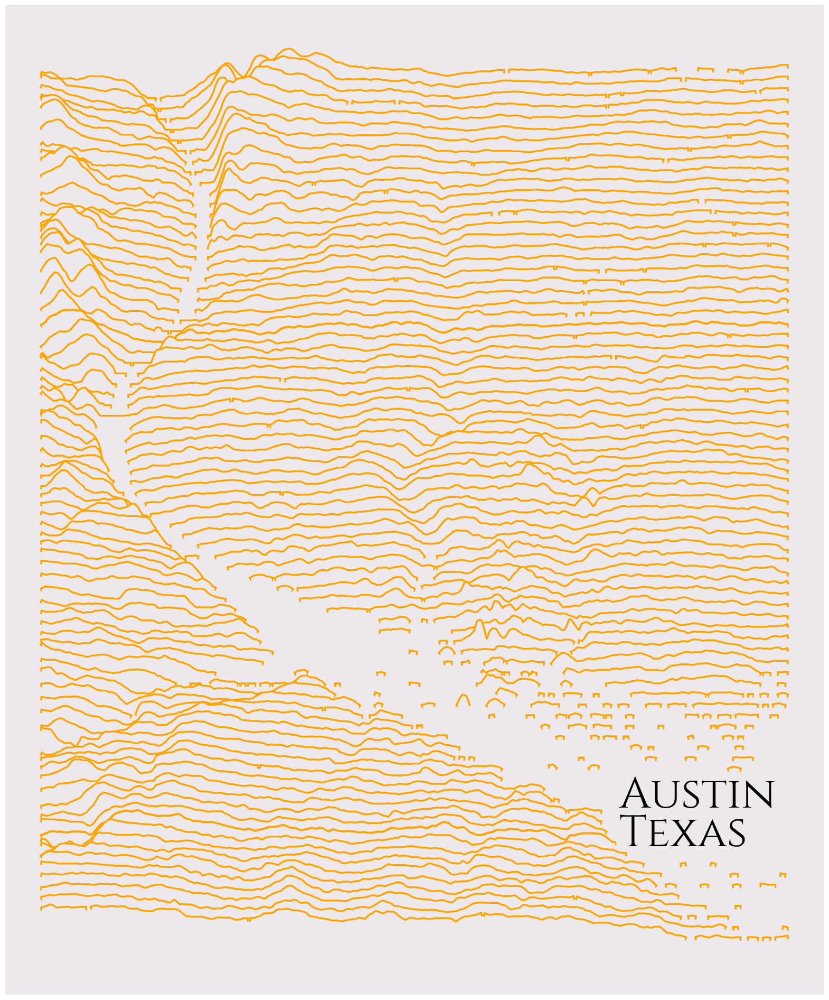

In [4]:
rm = RidgeMap((-97.794285,30.232226,-97.710171,30.334509))
values = rm.get_elevation_data(num_lines=80)
rm.plot_map(values=rm.preprocess(values=values, water_ntile=12, vertical_ratio=40),
            label='Austin\nTexas',
            label_x=0.75,
            linewidth=6,
            line_color='orange')

In [5]:
import matplotlib.pyplot as plt

4 25934402
4 25934402
4 2884802
4 25934402
4 25934402
4 25934402
4 25934402
4 25934402


<AxesSubplot: >

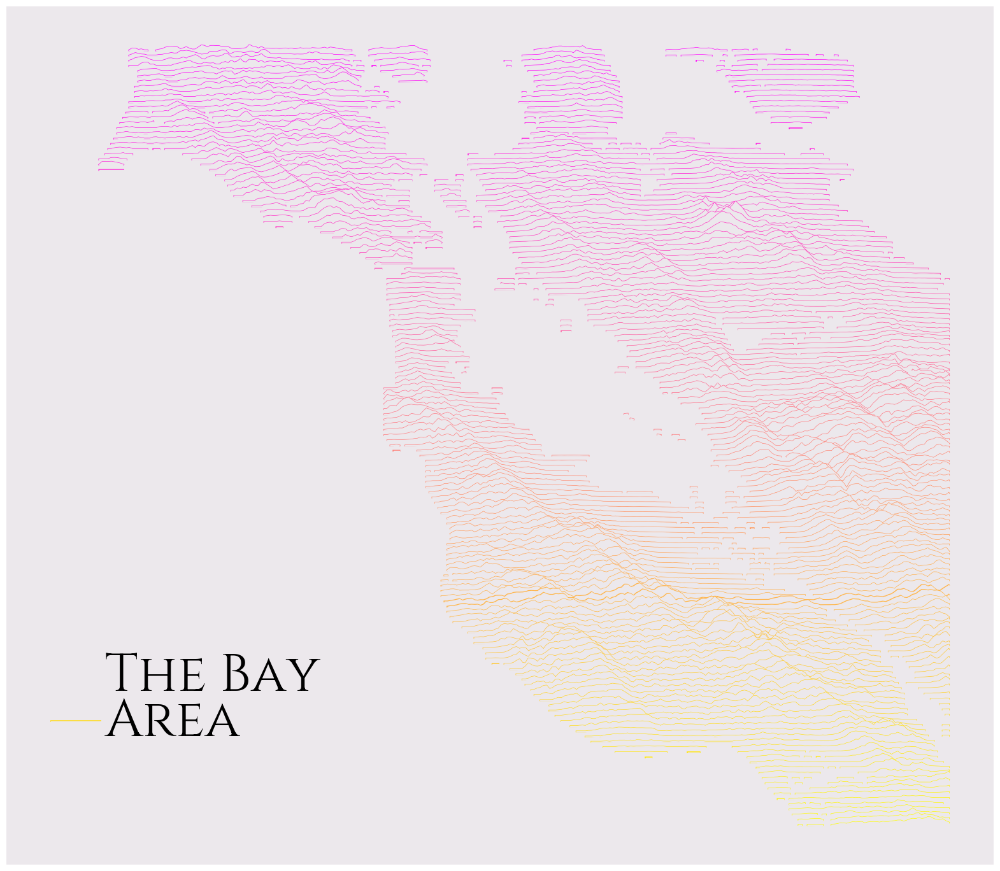

In [6]:
rm = RidgeMap((-123.107300,36.820279,-121.519775,38.210130))
values = rm.get_elevation_data(num_lines=150)
rm.plot_map(values=rm.preprocess(values=values, lake_flatness=3, water_ntile=50, vertical_ratio=30),
            label='The Bay\nArea',
            label_x=0.1,
            line_color = plt.get_cmap('spring'))

In [7]:
from ridge_map import FontManager

4 25934402
4 25934402
4 25934402
4 25934402
4 25934402
4 25934402


<AxesSubplot: >

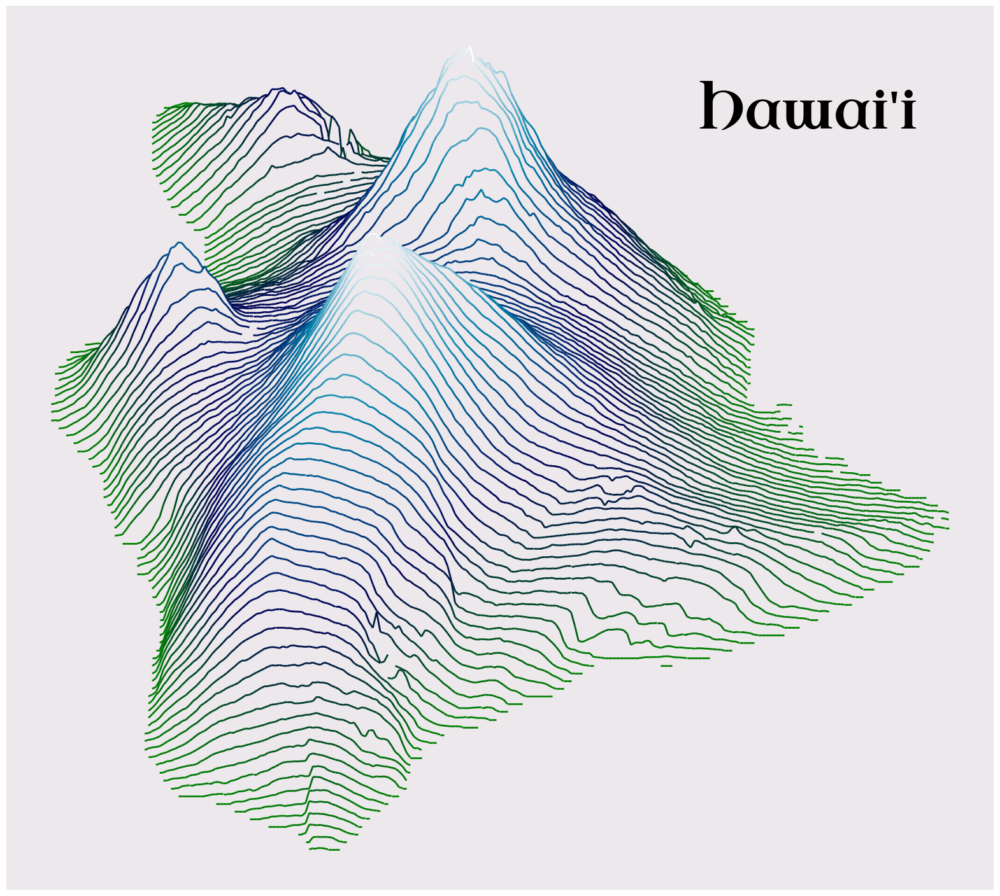

In [8]:
font = FontManager('https://github.com/google/fonts/blob/main/ofl/uncialantiqua/UncialAntiqua-Regular.ttf?raw=true')
rm = RidgeMap((-156.250305,18.890695,-154.714966,20.275080), font=font.prop)

values = rm.get_elevation_data(num_lines=100)
rm.plot_map(values=rm.preprocess(values=values, lake_flatness=2, water_ntile=10, vertical_ratio=240),
            label="Hawai'i",
            label_y=0.85,
            label_x=0.7,
            label_size=60,
            linewidth=2,
            line_color=plt.get_cmap('ocean'),
            kind='elevation')

4 25934402


<AxesSubplot: >

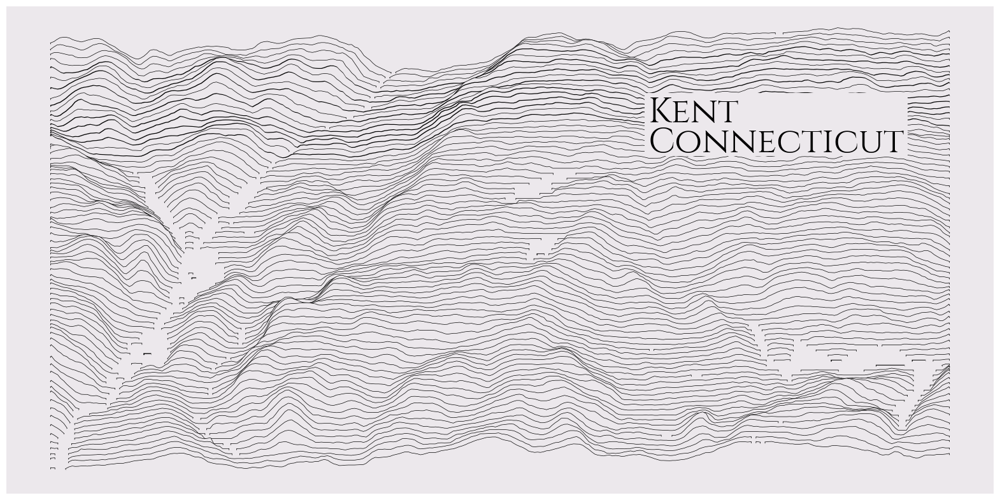

In [9]:
rm = RidgeMap((-73.509693,41.678682,-73.342838,41.761581))
values = rm.get_elevation_data()
rm.plot_map(values=rm.preprocess(values=values, lake_flatness=2, water_ntile=2, vertical_ratio=60),
            label='Kent\nConnecticut',
            label_y=0.7,
            label_x=0.65,
            label_size=40)

4 25934402
4 25934402


<AxesSubplot: >

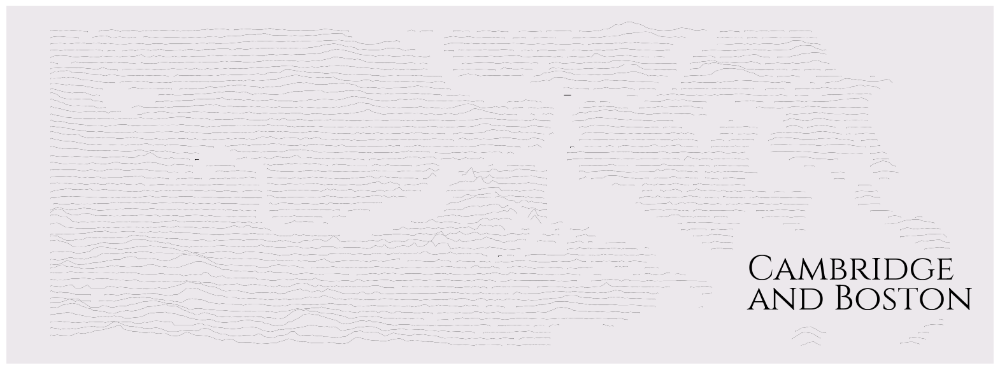

In [10]:
rm = RidgeMap((-71.167374,42.324286,-70.952454, 42.402672))
values = rm.get_elevation_data(num_lines=50)
rm.plot_map(values=rm.preprocess(values=values, lake_flatness=4, water_ntile=30, vertical_ratio=20),
            label='Cambridge\nand Boston',
            label_x=0.75,
            label_size=40,
            linewidth=1)

<AxesSubplot: >

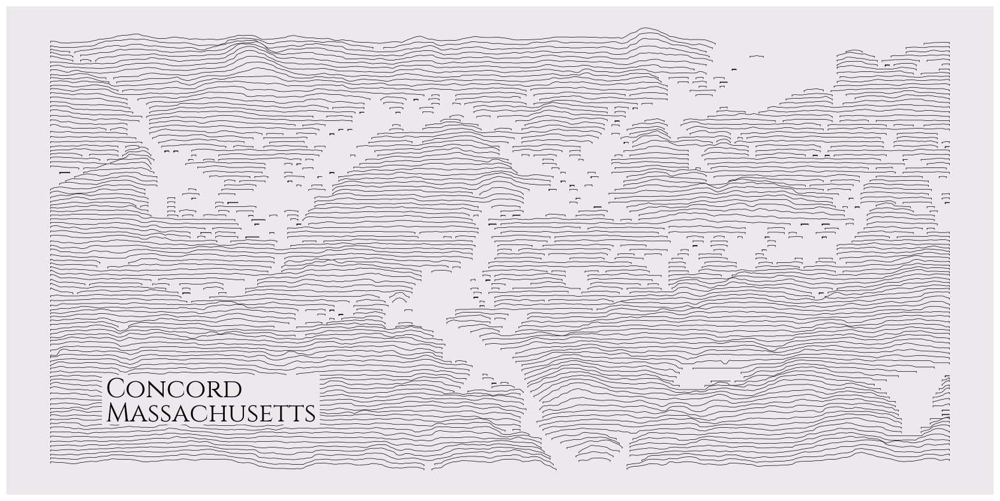

In [11]:
rm = RidgeMap((-71.418858,42.427511,-71.310024,42.481719))
values = rm.get_elevation_data(num_lines=100)
rm.plot_map(values=rm.preprocess(values=values, water_ntile=15, vertical_ratio=30),
            label='Concord\nMassachusetts',
            label_x=0.1,
            label_size=30)

<AxesSubplot: >

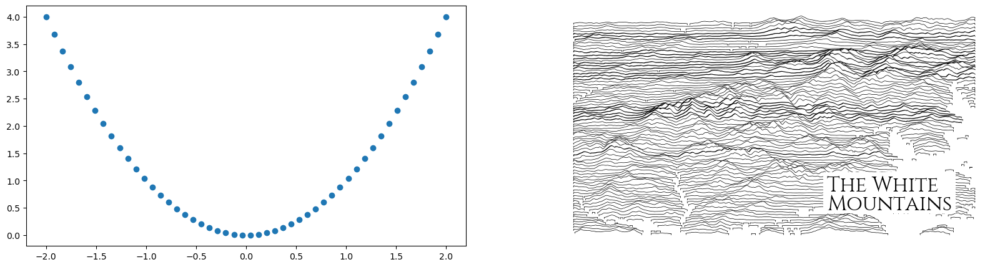

In [12]:
import numpy as np
fig, axes = plt.subplots(ncols=2, figsize=(20, 5))
x = np.linspace(-2, 2)
y = x * x

axes[0].plot(x, y, 'o')

rm = RidgeMap()
rm.plot_map(label_size=24, background_color=(1, 1, 1), ax=axes[1])

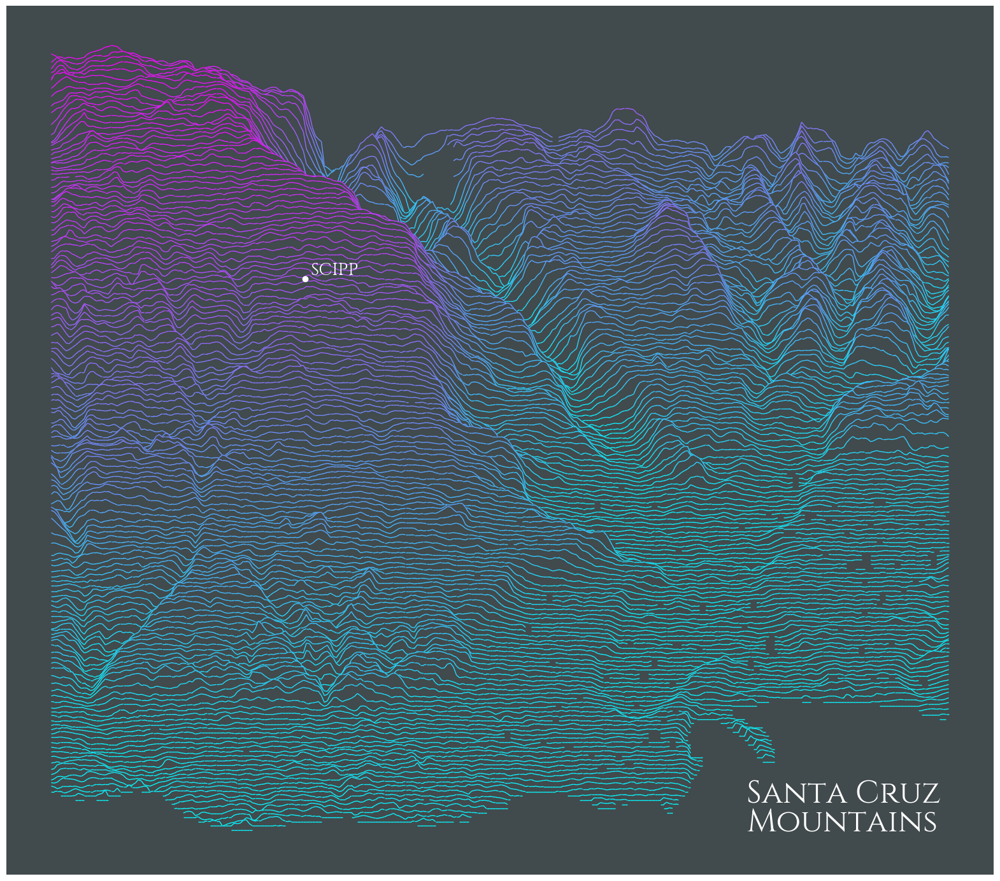

In [13]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

bgcolor = np.array([65,74,76])/255.

scipp = (-122.060510, 36.998776)
rm = RidgeMap((-122.087116,36.945365,-121.999226,37.023250))
scipp_coords = ((scipp[0] - rm.longs[0])/(rm.longs[1] - rm.longs[0]),(scipp[1] - rm.lats[0])/(rm.lats[1] - rm.lats[0]))

values = rm.get_elevation_data(num_lines=150)
ridges = rm.plot_map(values=rm.preprocess(values=values,
                                          lake_flatness=1,
                                          water_ntile=0,
                                          vertical_ratio=240),
            label='Santa Cruz\nMountains',
            label_x=0.75,
            label_y=0.05,
            label_size=36,
            kind='elevation',
            linewidth=1,
            background_color=bgcolor,
            line_color = plt.get_cmap('cool'))

# Bit of a hack to update the text label color
for child in ridges.get_children():
    if isinstance(child, matplotlib.text.Text) and 'Santa Cruz' in child._text:
        label_artist = child
        break
label_artist.set_color('white')

ridges.text(scipp_coords[0]+0.005, scipp_coords[1]+0.005, 'SCIPP',
            fontproperties=rm.font,
            size=20,
            color="white",
            transform=ridges.transAxes,
            verticalalignment="bottom",
            zorder=len(values)+10)

ridges.plot(*scipp_coords, 'o',
            color='white',
            transform=ridges.transAxes,
            ms=6,
            zorder=len(values)+10)